<a href="https://colab.research.google.com/github/jana-jovicic/Neural-Style-Transfer/blob/master/01_Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer stila

Transfer stila predstavlja optimizacionu tehniku kojom se od dve slike, _content image_ i _style image_, formira nova slika čiji sadržaj treba da odgovara sadržaju _content_ slike, a stil kojim je taj sadržaj predstavljen treba da odgovara stilu iz _style_ slike. 

In [ ]:
!unzip images.zip

Archive:  images.zip
   creating: images/
  inflating: images/content9.jpg     
  inflating: images/content16.png    
  inflating: images/content15.jpg    
  inflating: images/van-gogh-the-starry-night.jpg  
  inflating: images/van-gogh-landscape-with-olive-trees.jpg  
  inflating: images/seurat-A-Sunday-on-La-Grande-Jatte.jpg  
  inflating: images/picasso-muse.jpg  
  inflating: images/munch-the-scream.jpg  
  inflating: images/manet-water-lilies.jpg  
  inflating: images/klimt-The-Tree-Of-Life.jpg  
  inflating: images/klimt-the-kiss.jpg  
  inflating: images/hokusai-the-great-wave-off-kanagawa.jpg  
  inflating: images/friedrich-the-wanderer-above-the-sea-of-fog.jpg  
  inflating: images/dali-spider-of-the-evening.jpg  
  inflating: images/dali-melting-watch.jpg  
  inflating: images/content14.jpg    
  inflating: images/content13.jpg    
  inflating: images/content12.jpg    
  inflating: images/content11.jpg    
  inflating: images/content10.jpg    
  inflating: images/content8.jpg

In [ ]:
!unzip 01_outputs.zip

Archive:  01_outputs.zip
   creating: 01_outputs/
  inflating: 01_outputs/content5-munch-the-scream-(vgg19).jpg  
  inflating: 01_outputs/content6-munch-the-scream-(vgg16).jpg  
  inflating: 01_outputs/content6-munch-the-scream-(vgg19).jpg  
  inflating: 01_outputs/content5-munch-the-scream-(vgg16).jpg  
  inflating: 01_outputs/content15-munch-the-scream-(vgg16).jpg  
  inflating: 01_outputs/content11-munch-the-scream-(vgg16).jpg  
  inflating: 01_outputs/content11-van-gogh-the-starry-night-(vgg16).jpg  
  inflating: 01_outputs/content1-van-gogh-the-starry-night-(vgg16).jpg  
  inflating: 01_outputs/content1-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg  
  inflating: 01_outputs/content14-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg  
  inflating: 01_outputs/content3-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg  
  inflating: 01_outputs/content7-picasso-muse-(vgg16).jpg  
  inflating: 01_outputs/content13-picasso-muse-(vgg16).jpg  
  inflating: 01_outputs/content4-picasso-muse-

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import time
import functools
import os
import IPython.display

%tensorflow_version 2.x
import tensorflow as tf
from tensorflow.keras.preprocessing import image as kp_image
from tensorflow.keras.models import Model
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [ ]:
def load_image(image_path):
  image = Image.open(image_path)

  old_dimensions = image.size
  image = image.resize((512, 512), Image.ANTIALIAS)
  image = kp_image.img_to_array(image) 
  # add new axis to get shape (batch_size, height, width, number of channels)
  image = np.expand_dims(image, axis=0)
  return image, old_dimensions


def show_image(image):

  # if additional axis was added, remove it
  if len(image.shape) > 3:
    image = np.squeeze(image, axis=0)
  image = image.astype('uint8')

  # fig, axis1 = plt.subplots(1, 1, figsize=(14, 7))
  # axis1.imshow(image)
  # axis1.set_title(title)
  plt.figure(figsize=(7,7))
  plt.imshow(image)
  plt.show()

In [ ]:
def show_content_and_style_image(content_path, style_path):
  content_image = Image.open(content_path)
  style_image = Image.open(style_path)
  plt.figure(figsize=(10,10))
  plt.subplot(1,2,1)
  plt.imshow(content_image)
  plt.axis('off')
  plt.subplot(1,2,2)
  plt.imshow(style_image)
  plt.axis('off')
  plt.grid(False)
  plt.show()


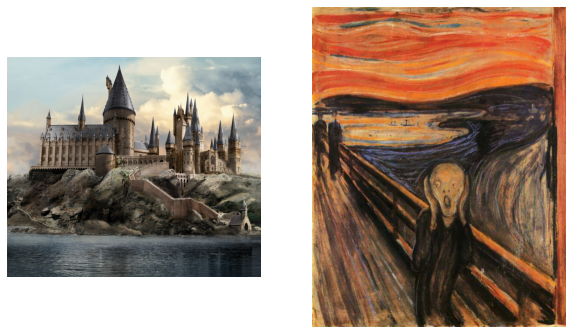

(1, 512, 512, 3) (1, 512, 512, 3)


In [ ]:
content_image_path = 'images' + os.path.sep + 'content6.jpg'
style_image_path = 'images' + os.path.sep + 'munch-the-scream.jpg'

content_image, _ = load_image(content_image_path)
style_image, _ = load_image(style_image_path)

show_content_and_style_image(content_image_path, style_image_path)
print(content_image.shape, style_image.shape)

### VGG model

Za prepoznavanje sadržaja i stila neke slike koristi se VGG (VGG16 ili VGG19) mreža koja je već istrenirana za klasifikaciju. Koriste se unutrašnji slojevi ove mreže pošto se pomoću njih prepoznaju karakteristike slike, poput ivica i tekstura. Završni, potpuno povezani slojevi, koji se koriste za samu klasifikaciju, nisu potrebni.


In [ ]:
vgg19_model = tf.keras.applications.VGG19()
print(vgg19_model.summary())

574717952/574710816 [==============================] - 5s 0us/step
Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
____________________________________________________________

In [ ]:
vgg16_model = tf.keras.applications.VGG16(weights='imagenet')
print(vgg16_model.summary())

553467904/553467096 [==============================] - 4s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
____________________________________________________________

In [ ]:
content_layers = ['block5_conv2'] 
style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
content_layers_number = len(content_layers)
style_layers_number = len(style_layers)

In [ ]:
def create_small_vgg_model(vgg_model, content_layers, style_layers):
  vgg_model.trainable = False
  output_layers = [vgg_model.get_layer(layer).output for layer in style_layers + content_layers]
  model = Model(vgg_model.input, output_layers)
  return model

Pošto je slike pre ubacivanja u VGG mrežu potrebno preprocesirati oduzimanjem srednjih vrednosti RGB piksela i konvertovanjem iz RGB sistema u BGR sistem, onda je nakon izlaska iz mreže potrebno ponovo dodati te srednje vrednosti i vratiti sliku u RGB sistem:

In [ ]:
def deprocess_img(processed_img):
  
  vgg_means = np.array([103.939, 116.779, 123.68])

  x = processed_img.copy()
  if len(x.shape) == 4:
    x = np.squeeze(x, 0)
  if len(x.shape) != 3:
    raise ValueError("Dimension of image must be (1, height, width, channel) or (height, width, channel)")
  
  # inverse of the preprocessing step:
  # add vgg means
  x[:, :, 0] += vgg_means[0]
  x[:, :, 1] += vgg_means[1]
  x[:, :, 2] += vgg_means[2]
  # convert BGR back to RGB  (https://note.nkmk.me/en/python-opencv-bgr-rgb-cvtcolor/)
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

## Funkcija greške

Ukupna greška koja se minimizuje izražena je zbirom greške vezane za stil i greške vezane za sadržaj slike:

$\mathcal{L}_{\text {total }}(\vec{p}, \vec{a}, \vec{x})=\alpha \mathcal{L}_{\text {content }}(\vec{p}, \vec{x})+\beta \mathcal{L}_{\text {style }}(\vec{a}, \vec{x})$,

gde su:

$\vec{p}$ - slika čiji nam je sadržaj bitan

$\vec{a}$ - slika čiji nam je stil bitan

$\vec{x}$ - generisana slika

$\alpha, \beta$ - Težine kojima kontrolišemo udeo greške sadržaja i greške stila u ukupnoj grešci.
Obično se uzimaju tako da je odnos $\alpha/\beta$ jednak: $1x10^{-3}$, $1x10^{-4}$, $5x10^{-4}$ i slično.

In [ ]:
def calculate_loss(model, style_weight, content_weight, initial_img, style_features, content_features):

  model_outputs = model(initial_img)
  
  style_output_features = model_outputs[:style_layers_number]
  content_output_features = model_outputs[style_layers_number:]
  
  style_loss = 0
  content_loss = 0

  # Accumulate style losses from all layers
  # Equally weight each contribution of each loss layer
  w_style = 1.0 / float(style_layers_number)
  for target_style, generated_style in zip(style_features, style_output_features):
    style_loss += w_style * calculate_style_loss_in_one_layer(generated_style[0], target_style)
    
  # Accumulate content losses from all layers
  for target_content, generated_content in zip(content_features, content_output_features):
    content_loss += calculate_content_loss(generated_content[0], target_content)
  
  style_loss *= style_weight
  content_loss *= content_weight

  total_loss = style_loss + content_loss 
  return total_loss, style_loss, content_loss

### Content loss


Neka je $\vec{p}$ originalna slika, $\vec{x}$ generisana slika, i neka su $P^l$ i $F^l$ njihove reprezentacije u $l$-tom sloju mreže. Tada se greška između te dve reprezentacije može izraziti kao:

$\mathcal{L}_{\text {content }}(\vec{p}, \vec{x}, l)=\frac{1}{2} \sum_{i, j}\left(F_{i j}^{l}-P_{i j}^{l}\right)^{2}$

Važi da $F^{l} \in \mathcal{R}^{N_{l} \times M_{l}}$, gde je $N_{l}$ broj različitih filtera u sloju $l$ (samim tim i broj feature mapa u sloju $l$), a $M_{l}$ veličina svake feature mape u sloju $l$ (izražena kao visina * širina feature mape). Onda $F_{i j}^{l}$ predstavlja aktivaciju $i$-tog filtera na poziciji $j$ u sloju $l$.

In [ ]:
def calculate_content_loss(F, P):
  '''
    Input: F, P - feature representations of generated and original image
  '''
  return 0.5 * tf.reduce_mean((F - P)**2)
  #return 0.5 * tf.reduce_sum((F - P)**2)

### Style loss

Prilikom računanja $style$ greške, ne poredimo reprezentacije $style$ slike i generisane slike koje su dobijene direktno iz mreže, već poredimo Gram matrice tih reprezentacija.

Gram matrica je matrica oblika $G = V^TV$, gde je V neka realna matrica. U suštini jedno polje gram matrice, $G_{ij}$, predstavlja skalarni proizvod vektora $v_i$ i $v_j$.

Ako posmatramo gram matricu u kontekstu feature mape, $G_{ij}^l$ predstavlja skalarni proizvod između vektorizovanih feature mapa $i$ i $j$ u sloju $l$:

$G_{i j}^{l}=\sum_{k} F_{i k}^{l} F_{j k}^{l}$.

Neka je $\vec{a}$ originalna slika, $\vec{x}$ generisana slika i neka su $A^l$ i $G^l$ gram matrice njihova reprezentacija stila na sloju $l$. Udeo sloja $l$ u ukupnoj grešci koja se tiče stila iznosi:

$E_{l}=\frac{1}{4 N_{l}^{2} M_{l}^{2}} \sum_{i, j}\left(G_{i j}^{l}-A_{i j}^{l}\right)^{2}$.

Ukupna greška koja se tiče stila računa se kao:

$\mathcal{L}_{\text {style }}(\vec{a}, \vec{x})=\sum_{l=0}^{L} w_{l} E_{l}$,

gde su $w_{l}$ težine koje određuju doprinos svakog sloja ukupnoj grešci. Ovde je uzeto da svaki sloj podjednako doprinosi grešci, odnosno da je svako $w_{l} = \frac{1}{broj\:slojeva\:koji\:se\:odnose\:na\:stil}$.

In [ ]:
def gram_matrix(F, N, M):
  '''
    Input: F - tensor; feature represenatation of image in given layer
           N - number of distinctive filters (and feature maps) in given layer
           M - size of each feature map in given layer (hight*width of map)
  '''
  # Reshape the tensor so it is a 2-dim matrix
  F = tf.reshape(F, (M, N))
  return tf.matmul(tf.transpose(F), F)

In [ ]:
def calculate_style_loss_in_one_layer(g, a):
  ''' 
  Calculate the style loss at a certain layer
  Input:  a - feature representation of the style image at given layer
          g - feature representation of the generated image at given layer
  '''
  height, width, N = g.get_shape().as_list()
  M = height * width
  G = gram_matrix(g, N, M)
  A = gram_matrix(a, N, M)
  E = tf.reduce_sum((G - A) ** 2) / (4 * (N**2) * (M**2))
  #E = tf.reduce_sum((G - A) ** 2) / (4.0 * N * M)
  #E = tf.reduce_mean((G - A) ** 2)
  return E

## Računanje gradijenata i optimizacija

In [ ]:
def stylize_image(content_path, style_path, vgg_model, show_images=False, show_loss=False): 
  
  iterations = 500
  content_weight=1000.0
  style_weight=0.1

  model = create_small_vgg_model(vgg_model, content_layers, style_layers)
  for layer in model.layers:
    layer.trainable = False

  content_img, old_dimensions_content = load_image(content_path)
  style_img, old_dimensions_style = load_image(style_path)
  initial_img, _ = load_image(content_path)

  content_img = tf.keras.applications.vgg16.preprocess_input(content_img)
  style_img = tf.keras.applications.vgg16.preprocess_input(style_img)
  initial_img = tf.keras.applications.vgg16.preprocess_input(initial_img)
  initial_img = tf.Variable(initial_img, dtype=tf.float32)  

  style_outputs = model(style_img)
  content_outputs = model(content_img)
  #print(style_outputs)

  # Get style and content feature representations from model  
  style_features = [style_layer[0] for style_layer in style_outputs[:style_layers_number]]
  content_features = [content_layer[0] for content_layer in content_outputs[style_layers_number:]]
  
  optimizer = tf.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=1e-1)

  best_img =  None
  best_loss = float('inf')
  losses = []

  display_image_interval = iterations / 5
  
  start_time = time.time()
  
  for i in range(iterations):
    
    with tf.GradientTape() as tape: 
      total_loss, style_score, content_score = calculate_loss(model, style_weight, content_weight, initial_img, style_features, content_features)
      gradients = tape.gradient(total_loss, initial_img)
    
    optimizer.apply_gradients([(gradients, initial_img)])

    losses.append(total_loss)

    if total_loss < best_loss:
      best_loss = total_loss
      best_img = deprocess_img(initial_img.numpy())

    if show_images:
      if (i % display_image_interval == 0) or (i == iterations-1):
        plot_img = initial_img.numpy()
        plot_img = deprocess_img(plot_img)
        show_image(plot_img)
        print('Iteration: {0}, total loss: {1}, style score: {2}, content score: {3}'
        .format(i, total_loss, style_score, content_score))

  if show_loss:
    plt.plot(range(iterations), losses)
    plt.show()

  end_time = time.time()
  hours, rem = divmod(end_time - start_time, 3600)
  minutes, seconds = divmod(rem, 60)
  print('Time: {:0>2}:{:0>2}:{:05.2f}'.format(int(hours), int(minutes), seconds))
  print()
  
  best_img = Image.fromarray(best_img).resize(old_dimensions_content, Image.ANTIALIAS)

  return best_img, best_loss 

In [ ]:
def show_stylized_image(stylized_image, k=1):
  # convert pixel size to inch size:  inch_size = pixel_size * 1/96
  # and show image k times smaller
  plt.figure(figsize=(stylized_image.size[0]/(96*k), stylized_image.size[1]/(96*k)))
  plt.imshow(stylized_image)
  plt.axis('off')
  plt.show()

## Primeri primene transfera stila

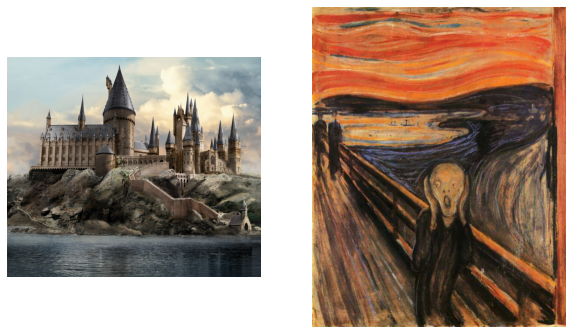

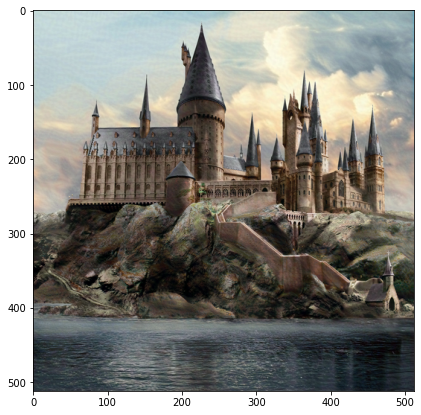

Iteration: 0, total loss: 14234554.0, style score: 14234554.0, content score: 0.0


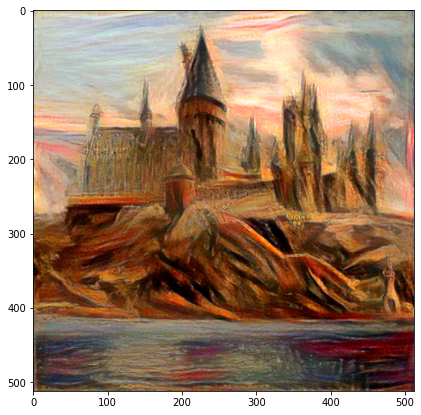

Iteration: 100, total loss: 523782.1875, style score: 384688.71875, content score: 139093.46875


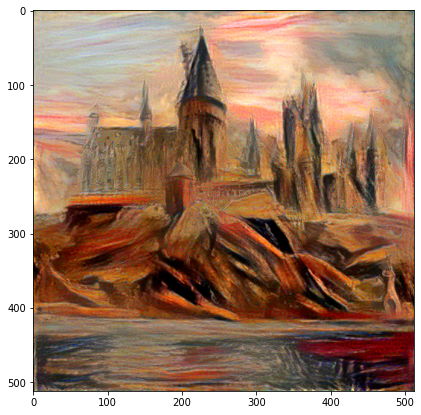

Iteration: 200, total loss: 245282.453125, style score: 145259.046875, content score: 100023.40625


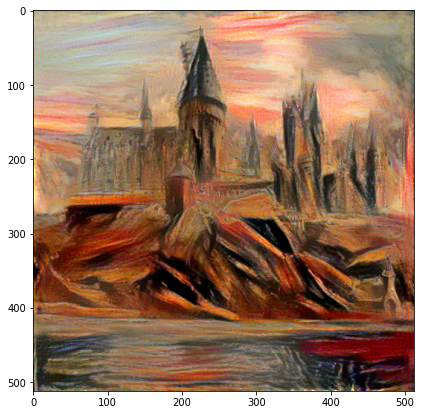

Iteration: 300, total loss: 161692.875, style score: 85944.5546875, content score: 75748.3125


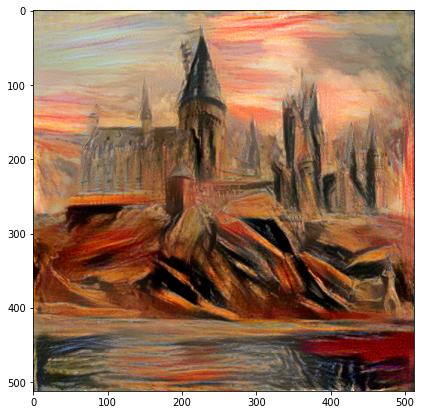

Iteration: 400, total loss: 121183.2578125, style score: 58826.69921875, content score: 62356.55859375


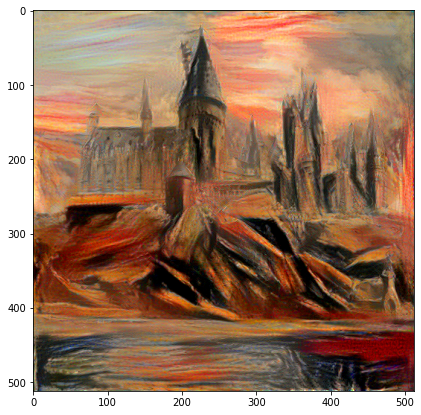

Iteration: 499, total loss: 100587.578125, style score: 46379.90234375, content score: 54207.671875


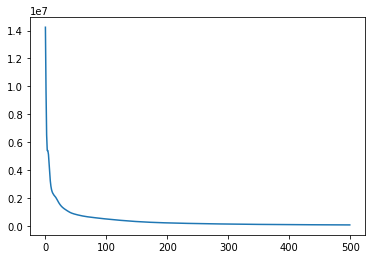

Time: 00:02:49.75



In [ ]:
content_image_path = 'images/content6.jpg'
style_image_path = 'images/munch-the-scream.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path, 
                                     vgg_model = vgg16_model, 
                                     show_images=True, show_loss=True)
stylized_image.save('01_outputs/content6-munch-the-scream-(vgg16).jpg')

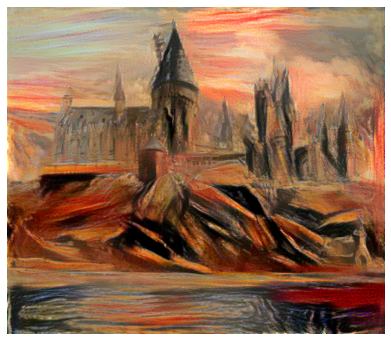

In [ ]:
show_stylized_image(stylized_image, 3)

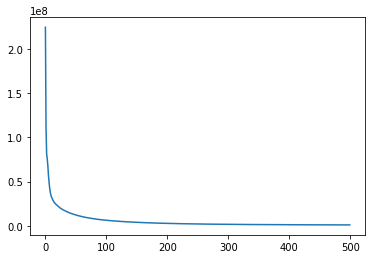

Time: 00:03:10.23



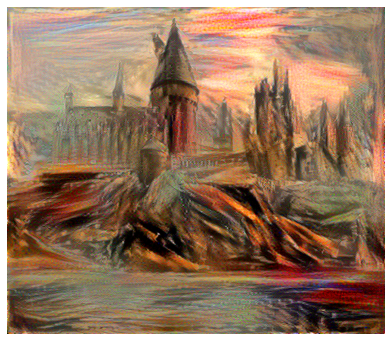

In [ ]:
# vgg19 model
stylized_image, loss = stylize_image(content_path=content_image_path, 
                                     style_path=style_image_path,  
                                     vgg_model=vgg19_model, 
                                     show_images=False, show_loss=True)
stylized_image.save('01_outputs/content6-munch-the-scream-(vgg19).jpg')
show_stylized_image(stylized_image, 3)

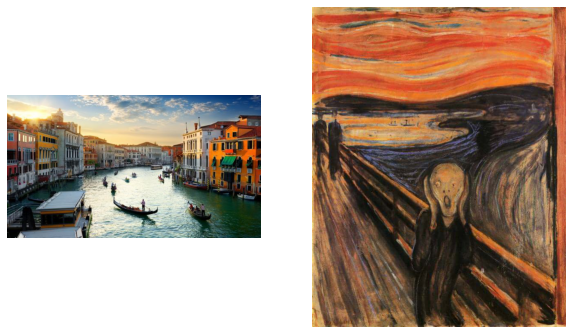

Time: 00:02:47.33



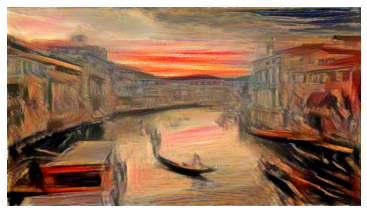

Loss:  132910.5


In [ ]:
content_image_path = 'images/content3.jpg'
style_image_path = 'images/munch-the-scream.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path, 
                                     vgg_model = vgg16_model)
stylized_image.save('01_outputs/content3-munch-the-scream-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)

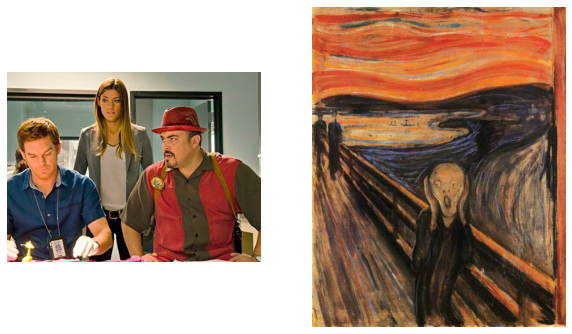

Time: 00:02:46.32



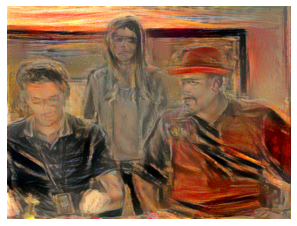

Loss:  131506.672


In [ ]:
content_image_path = 'images/content14.jpg'
style_image_path = 'images/munch-the-scream.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path, 
                                     vgg_model=vgg16_model)
stylized_image.save('01_outputs/content14-munch-the-scream-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)

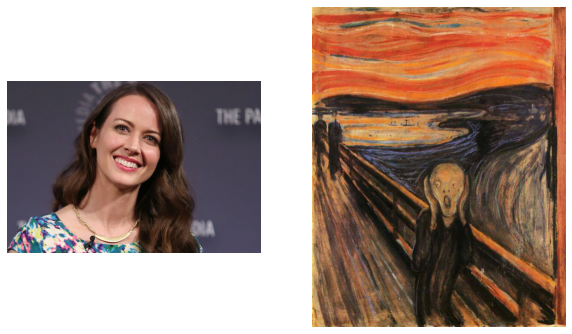

Time: 00:02:47.12



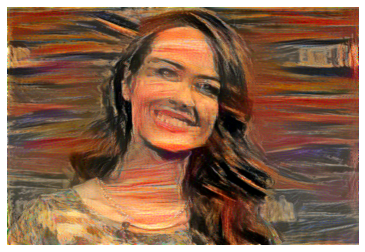

Loss:  80946.0469


In [ ]:
content_image_path = 'images/content11.jpg'
style_image_path = 'images/munch-the-scream.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path, 
                                     vgg_model = vgg16_model)
stylized_image.save('01_outputs/content11-munch-the-scream-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)

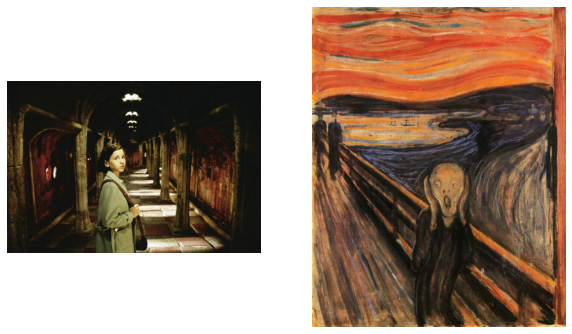

Time: 00:02:46.35



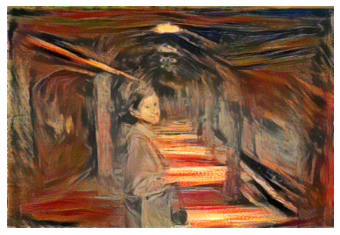

Loss:  84115.3281


In [ ]:
content_image_path = 'images/content19.jpg'
style_image_path = 'images/munch-the-scream.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path,
                                     vgg_model = vgg16_model)
stylized_image.save('01_outputs/content19-munch-the-scream-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)

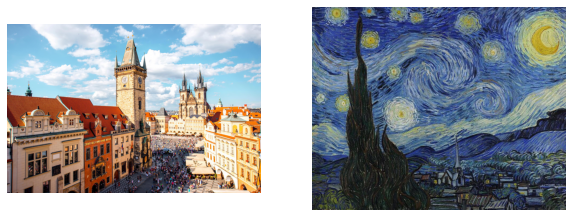

Time: 00:02:47.09



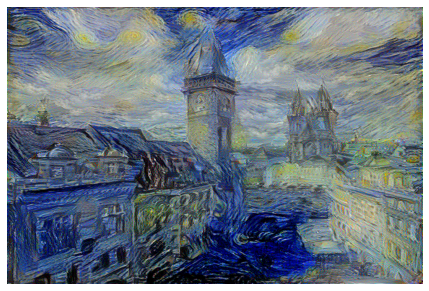

Loss:  221173.734


In [ ]:
content_image_path = 'images/content1.jpg'
style_image_path = 'images/van-gogh-the-starry-night.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path, 
                                     vgg_model=vgg16_model)
stylized_image.save('01_outputs/content1-van-gogh-the-starry-night-(vgg16).jpg')
show_stylized_image(stylized_image, 3)
tf.print('Loss: ', loss)

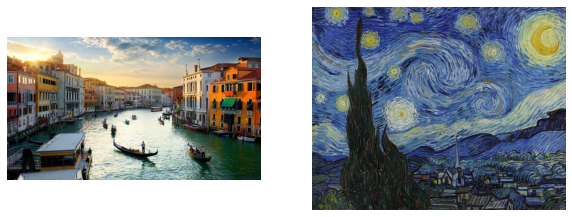

Time: 00:02:47.21



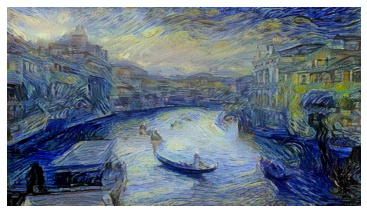

Loss:  140051


In [ ]:
content_image_path = 'images/content3.jpg'
style_image_path = 'images/van-gogh-the-starry-night.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path, 
                                     vgg_model=vgg16_model)
stylized_image.save('01_outputs/content3-van-gogh-the-starry-night-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)

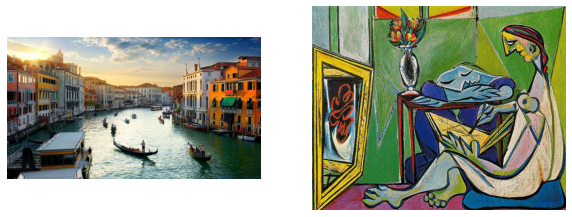

Time: 00:02:47.37



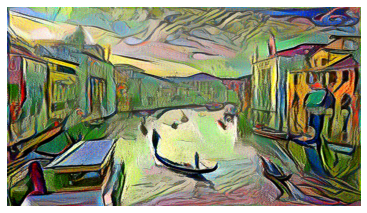

Loss:  477256.375


In [ ]:
content_image_path = 'images/content3.jpg'
style_image_path = 'images/picasso-muse.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path,
                                     vgg_model = vgg16_model)
stylized_image.save('01_outputs/content3-picasso-muse-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)

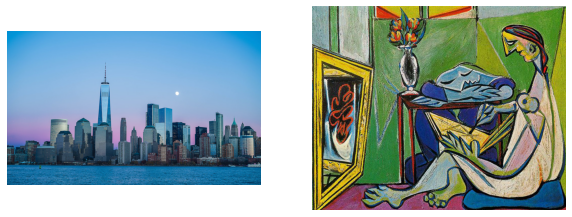

Time: 00:02:47.33



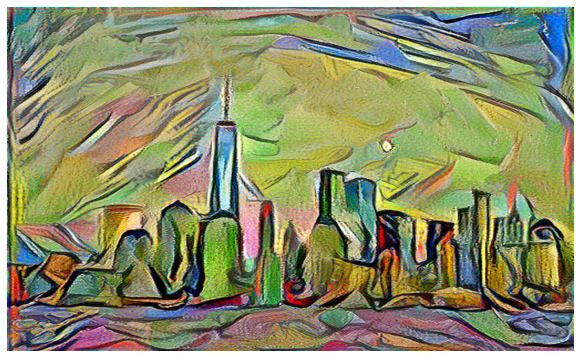

Loss:  551792


In [ ]:
content_image_path = 'images/content4.jpeg'
style_image_path = 'images/picasso-muse.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path,
                                     vgg_model = vgg16_model)
stylized_image.save('01_outputs/content4-picasso-muse-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)

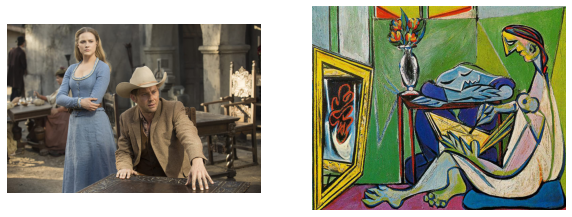

Time: 00:02:47.46



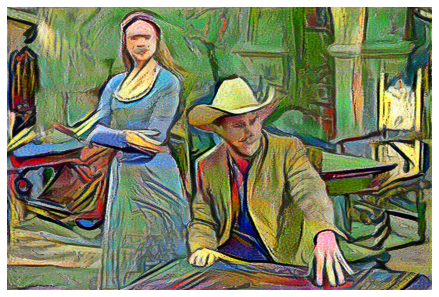

Loss:  474723.625


In [ ]:
content_image_path = 'images/content15.jpg'
style_image_path = 'images/picasso-muse.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path,
                                     vgg_model = vgg16_model)
stylized_image.save('01_outputs/content15-picasso-muse-(vgg16).jpg')
show_stylized_image(stylized_image, 2)
tf.print('Loss: ', loss)

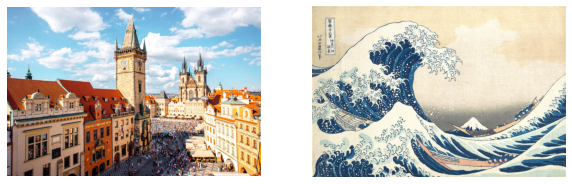

Time: 00:02:46.73



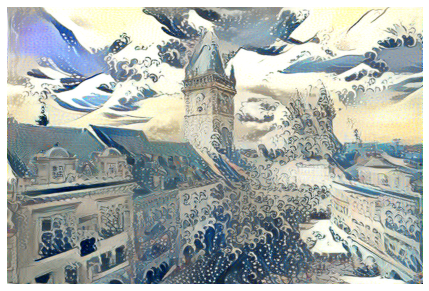

Loss:  369224.938


In [ ]:
content_image_path = 'images/content1.jpg'
style_image_path = 'images/hokusai-the-great-wave-off-kanagawa.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path, 
                                     vgg_model=vgg16_model)
stylized_image.save('01_outputs/content1-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg')
show_stylized_image(stylized_image, 3)
tf.print('Loss: ', loss)

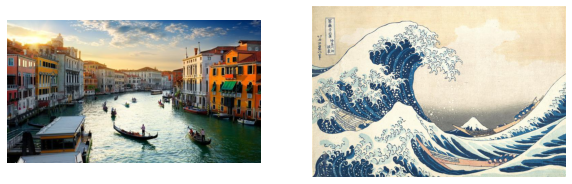

Time: 00:02:48.06



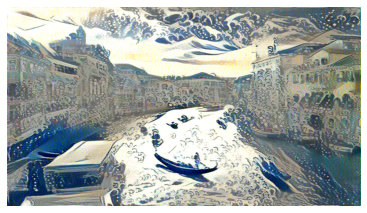

Loss:  365192.812


In [ ]:
content_image_path = 'images/content3.jpg'
style_image_path = 'images/hokusai-the-great-wave-off-kanagawa.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path, 
                                     vgg_model=vgg16_model)
stylized_image.save('01_outputs/content3-hokusai-the-great-wave-off-kanagawa-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)

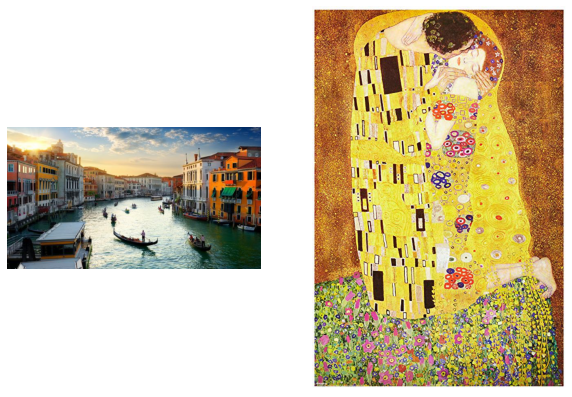

Time: 00:02:47.30



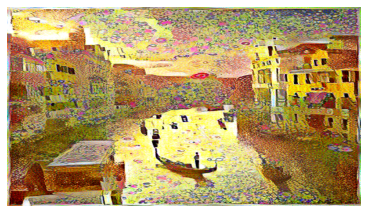

Loss:  517685.062


In [ ]:
content_image_path = 'images/content3.jpg'
style_image_path = 'images/klimt-the-kiss.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path,
                                     vgg_model = vgg16_model)
stylized_image.save('01_outputs/content3-klimt-the-kiss-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)

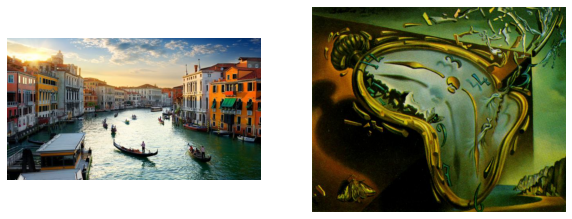

Time: 00:02:46.68



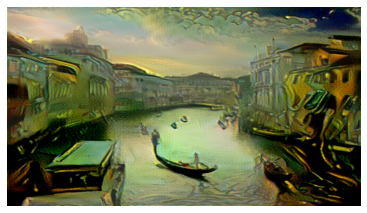

Loss:  178392.781


In [ ]:
content_image_path = 'images/content3.jpg'
style_image_path = 'images/dali-melting-watch.jpg'
show_content_and_style_image(content_image_path, style_image_path)
stylized_image, loss = stylize_image(content_path = content_image_path, 
                                     style_path = style_image_path,
                                     vgg_model = vgg16_model)
stylized_image.save('01_outputs/content3-dali-melting-watch-(vgg16).jpg')
show_stylized_image(stylized_image)
tf.print('Loss: ', loss)